In [1]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime.lime_tabular

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.ensemble import RandomForestRegressor, VotingRegressor,AdaBoostRegressor,GradientBoostingRegressor
from scikeras.wrappers import KerasRegressor
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

In [2]:
#Read the Dataset
smart_drying_dataset = pd.read_excel('test.xlsx', sheet_name='Sheet2')

In [3]:
#print the column names
print(smart_drying_dataset.columns)

Index(['DryingType', 'SetNo', 'Date', 'Operating_Temperature', 'Intermittency',
       'AirVelocity', 'DryingPeriod', 'Relative_Humidity', 'Tempering',
       'InitialWeight', 'BoneDryWeight', 'Weight_of_H2O',
       'FinalMoistureContent', 'WeightofDryMatter', 'DryingTime',
       'WeightofSample1', 'MoistureContent', 'MoistureRatio', 'DryingRate'],
      dtype='object')


In [4]:
# Print the summary information of the DataFrame named 'smart_drying_dataset'
print(smart_drying_dataset.info)

<bound method DataFrame.info of      DryingType  SetNo       Date  Operating_Temperature  Intermittency  \
0      HeatPump      1 2014-03-20                   40.6            1.0   
1      HeatPump      1 2014-03-20                   40.6            1.0   
2      HeatPump      1 2014-03-20                   40.6            1.0   
3      HeatPump      1 2014-03-20                   40.6            1.0   
4      HeatPump      1 2014-03-20                   40.6            1.0   
..          ...    ...        ...                    ...            ...   
640  Solardying     21 2015-11-24                   30.0            1.0   
641  Solardying     21 2015-11-24                   30.0            1.0   
642  Solardying     21 2015-11-24                   30.0            1.0   
643  Solardying     21 2015-11-24                   30.0            1.0   
644  Solardying     21 2015-11-24                   30.0            1.0   

     AirVelocity  DryingPeriod  Relative_Humidity  Tempering  Initi

In [5]:
# Print a summary of statistics for numerical columns in the DataFrame named 'smart_drying_dataset'
print(smart_drying_dataset.describe())


            SetNo                           Date  Operating_Temperature  \
count  645.000000                            645             645.000000   
mean    10.530233  2014-04-11 20:18:58.604651264              32.858605   
min      1.000000            2014-03-20 00:00:00              25.000000   
25%      6.000000            2014-03-20 00:00:00              25.000000   
50%     10.000000            2014-03-20 00:00:00              28.600000   
75%     16.000000            2014-03-20 00:00:00              40.000000   
max     21.000000            2015-11-24 00:00:00              40.600000   
std      5.783445                            NaN               6.791663   

       Intermittency  AirVelocity  DryingPeriod  Relative_Humidity  \
count     645.000000   645.000000    645.000000         645.000000   
mean        0.618992     4.440000      4.784496          23.223566   
min         0.200000     0.300000      1.000000          16.200000   
25%         0.330000     4.600000      1.000

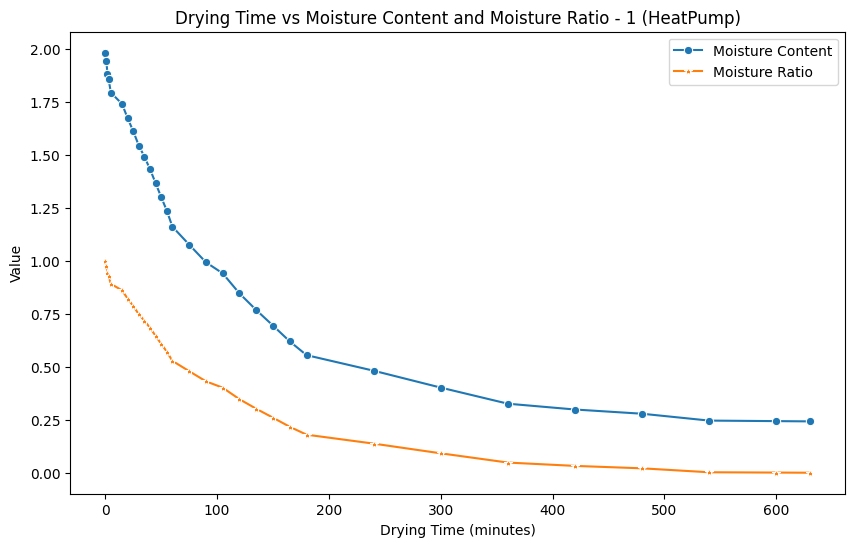

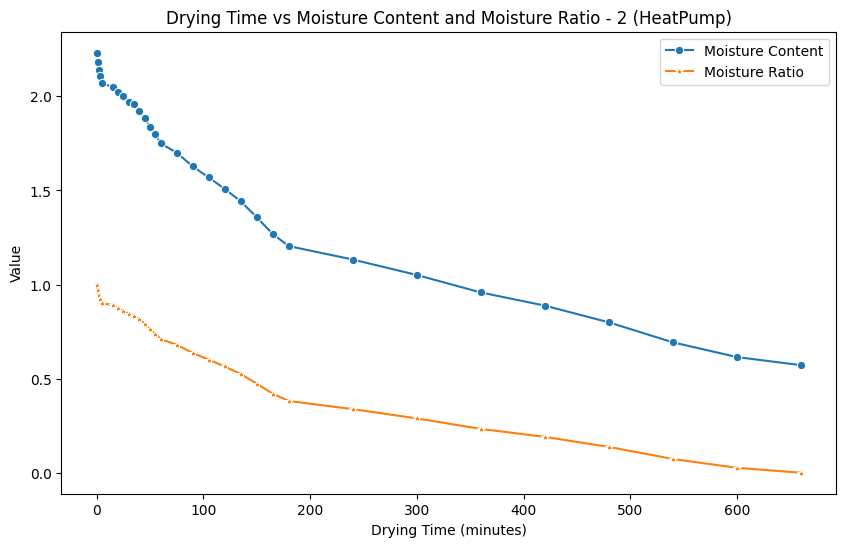

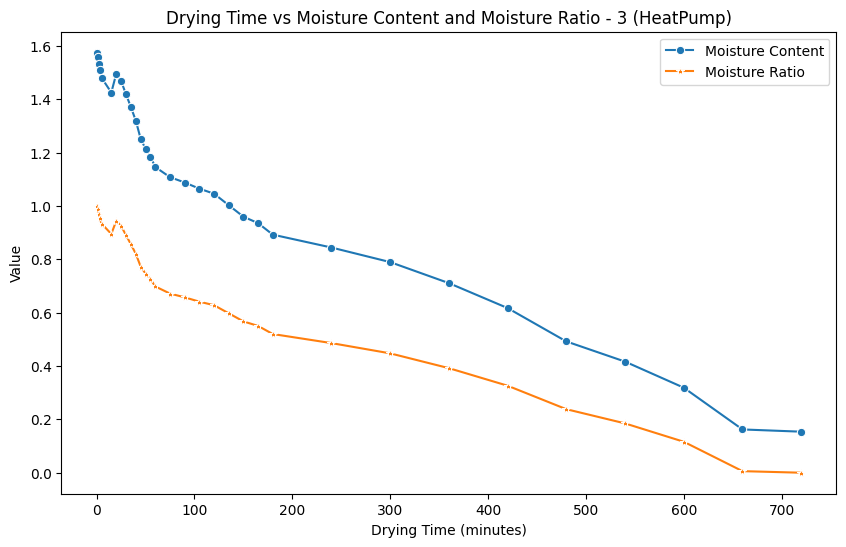

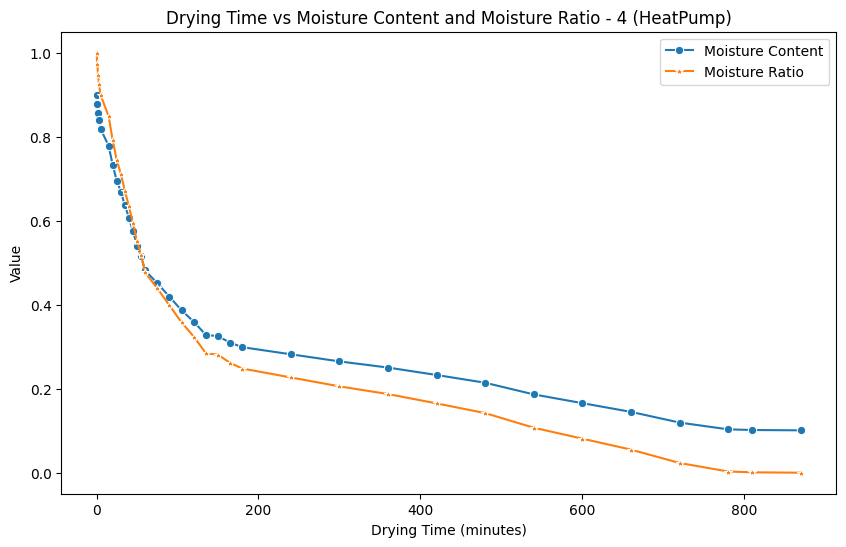

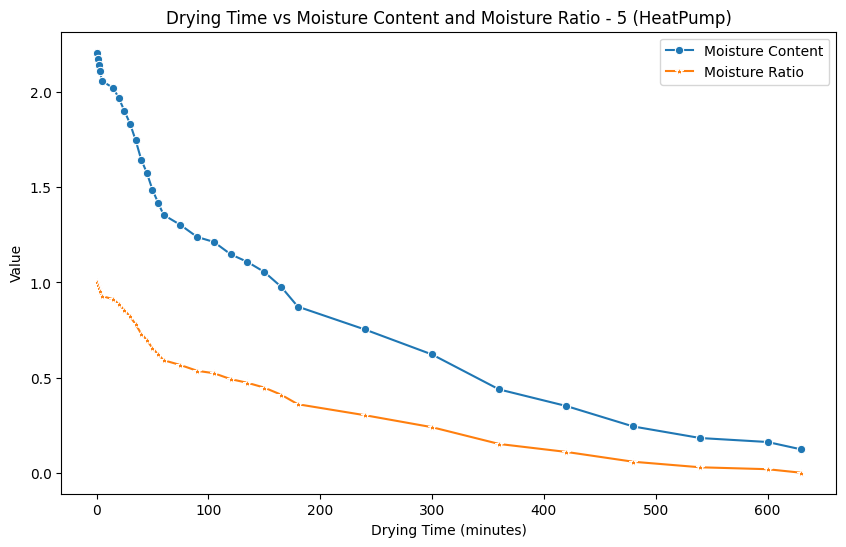

...

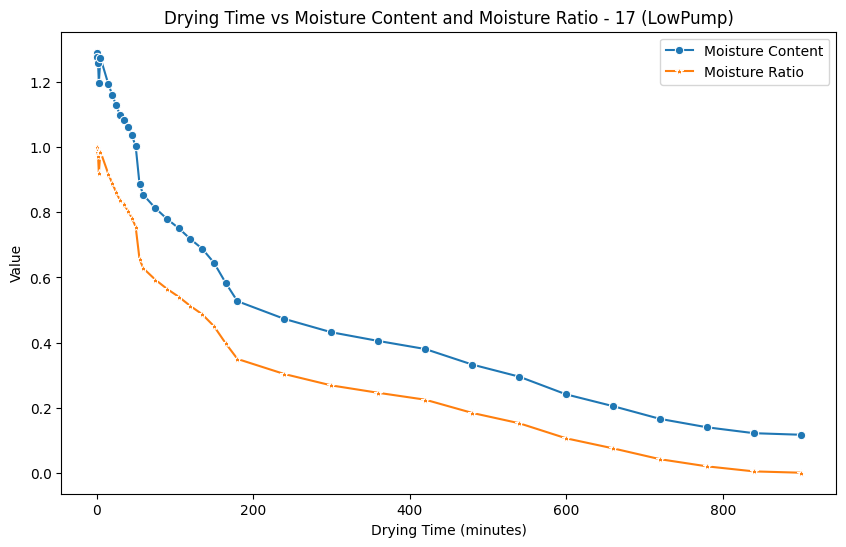

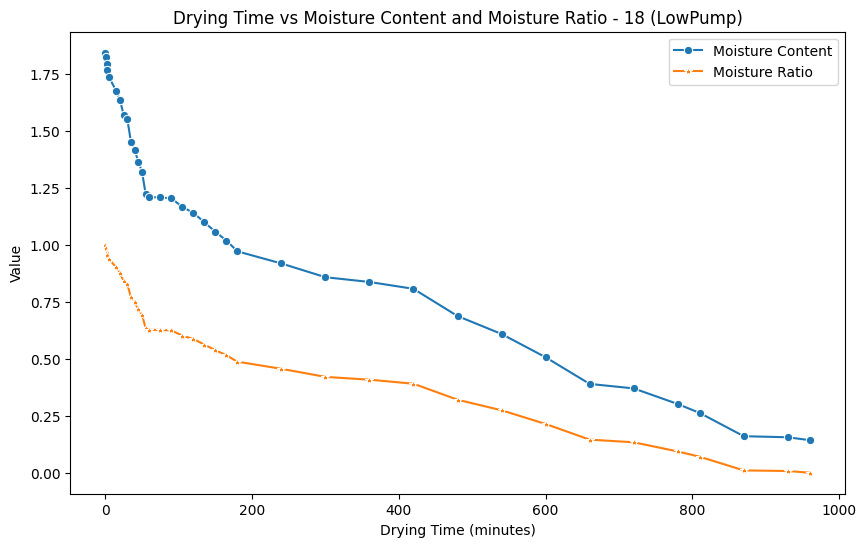

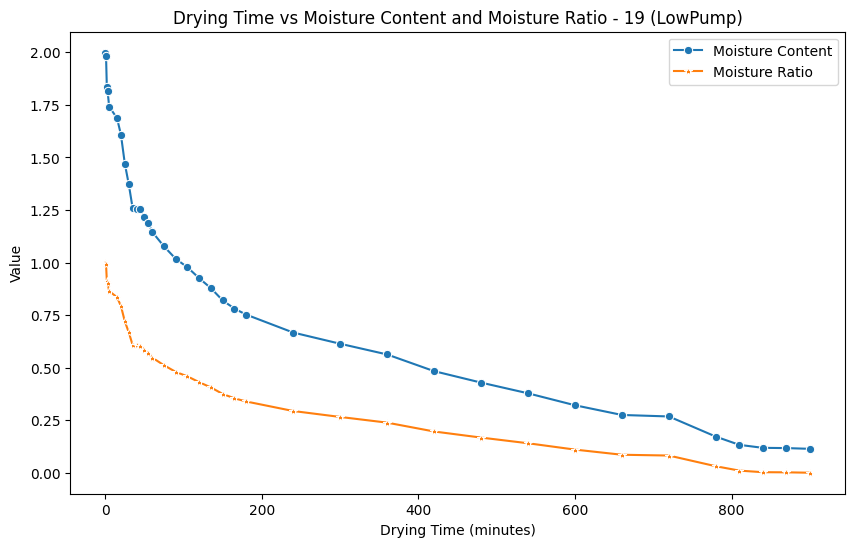

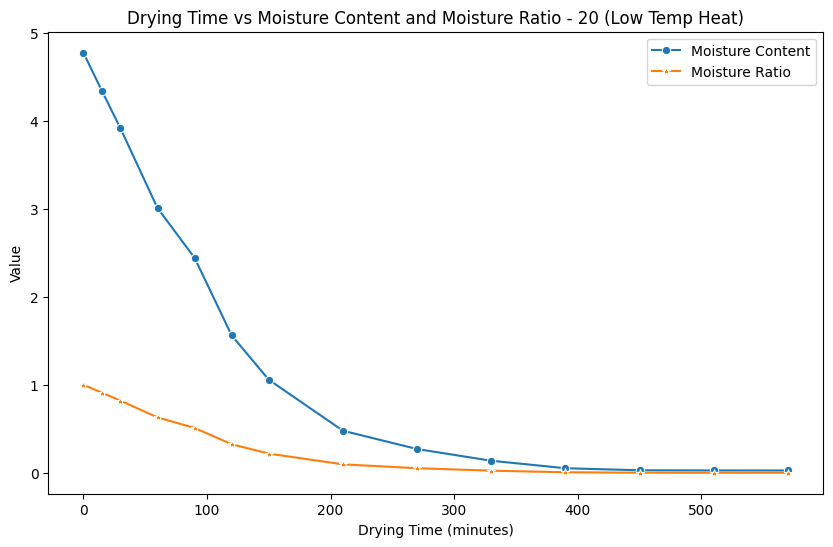

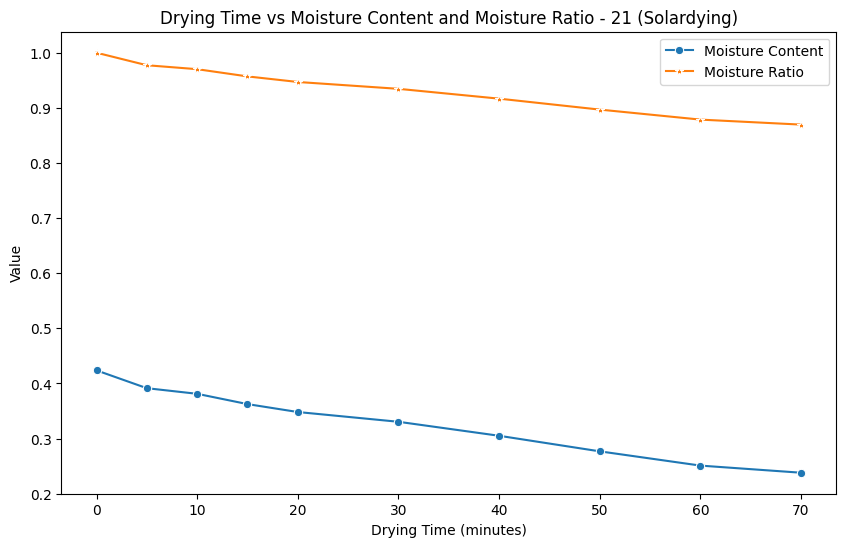

In [6]:
# Get the unique experiment set numbers from the 'SetNo' column of the DataFrame
experiments = smart_drying_dataset['SetNo'].unique()

# Loop through each unique experiment
for experiment in experiments:
    # Create a subset of the data corresponding to the current experiment
    subset = smart_drying_dataset[smart_drying_dataset['SetNo'] == experiment]
    
    # Get the drying type for the current experiment (assuming it's the same for all rows in this subset)
    drying_type = subset['DryingType'].iloc[0]
    
    # Create a new figure for plotting with a specific size
    plt.figure(figsize=(10, 6))
    
    # Plot Moisture Content over Drying Time with circular markers
    sns.lineplot(data=subset, x='DryingTime', y='MoistureContent', marker='o', label='Moisture Content')
    
    # Plot Moisture Ratio over Drying Time with star markers
    sns.lineplot(data=subset, x='DryingTime', y='MoistureRatio', marker='*', label='Moisture Ratio')
    
    # Set the title of the plot, including the experiment number and drying type
    plt.title(f'Drying Time vs Moisture Content and Moisture Ratio - {experiment} ({drying_type})')
    
    # Label the x-axis as 'Drying Time (minutes)'
    plt.xlabel('Drying Time (minutes)')
    
    # Label the y-axis as 'Value'
    plt.ylabel('Value')
    
    # Display a legend to differentiate between the Moisture Content and Moisture Ratio lines
    plt.legend()
    
    # Show the plot
    plt.show()


In [7]:
# Drop the columns 'SetNo', 'Date', and 'FinalMoistureContent' from the DataFrame
smart_drying_dataset.drop(columns=['SetNo', 'Date', 'FinalMoistureContent'], inplace=True)

# Fill any missing values in the 'Tempering' column with 0
smart_drying_dataset['Tempering'] = smart_drying_dataset['Tempering'].fillna(0)

# Print the remaining column names of the DataFrame to verify the changes
print(smart_drying_dataset.columns)


Index(['DryingType', 'Operating_Temperature', 'Intermittency', 'AirVelocity',
       'DryingPeriod', 'Relative_Humidity', 'Tempering', 'InitialWeight',
       'BoneDryWeight', 'Weight_of_H2O', 'WeightofDryMatter', 'DryingTime',
       'WeightofSample1', 'MoistureContent', 'MoistureRatio', 'DryingRate'],
      dtype='object')


# Data Preprocessing

In [8]:
# Separate the features (independent variables) from the target (dependent variable)
# X contains all the columns except 'MoistureContent', which is our target variable
X = smart_drying_dataset.drop(columns=['MoistureContent'])

# Y contains only the 'MoistureContent' column, which we are trying to predict
Y = smart_drying_dataset[['MoistureContent']]

# Split the dataset into training and testing sets
# 80% of the data is used for training, and 20% is reserved for testing
# The 'random_state' parameter ensures reproducibility of the split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=41)

In [9]:
# Initialize the OneHotEncoder with the argument 'sparse_output=False' to get a dense array output
drying_type_encoder = OneHotEncoder(sparse_output=False)

# Apply the OneHotEncoder to the 'DryingType' column of the DataFrame
X_train_encoded_drying_types = pd.DataFrame(drying_type_encoder.fit_transform(X_train[['DryingType']]),columns=drying_type_encoder.get_feature_names_out(['DryingType']) )
X_test_encoded_drying_types=pd.DataFrame(drying_type_encoder.transform(X_test[['DryingType']]), columns=drying_type_encoder.get_feature_names_out(['DryingType']))
# Convert the one-hot encoded data into a DataFrame with appropriate column names
# encoded_drying_types_df = pd.DataFrame(encoded_drying_types, columns=drying_type_encoder.get_feature_names_out(['DryingType']))

In [10]:
X_test_scaledd=X_test

In [11]:
scaler = MinMaxScaler()

# Fit the scaler on the training data and transform both training and test data
# The scaler is fit to the training data to learn the scaling parameters
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train.drop(columns=['DryingType'])),columns=list(X_train.drop(columns=['DryingType']).columns))
X_test_scaled = pd.DataFrame(scaler.transform(X_test.drop(columns=['DryingType'])),columns=list(X_train.drop(columns=['DryingType']).columns))


In [12]:
X_test_rescaled = scaler.inverse_transform(X_test_scaled)

In [13]:
X_test_rescaled = pd.DataFrame(X_test_rescaled, columns=X_test_scaled.columns)
X_test_rescaled

,Operating_Temperature,Intermittency,AirVelocity,DryingPeriod,Relative_Humidity,Tempering,InitialWeight,BoneDryWeight,Weight_of_H2O,WeightofDryMatter,DryingTime,WeightofSample1,MoistureRatio,DryingRate
0,28.6,0.33,4.6,1.0,26.7,2.0,0.64,0.580,0.060,14.055938,780.0,15.61,0.012092,0.000745
1,25.0,0.33,4.6,1.0,27.5,2.0,0.67,0.600,0.070,10.477612,600.0,13.00,0.105691,0.001750
2,28.6,1.00,4.6,10.0,26.7,0.0,0.54,0.505,0.035,7.575000,75.0,15.55,0.492725,0.013501
3,25.0,0.67,4.6,2.0,27.5,1.0,0.64,0.580,0.060,8.101875,750.0,8.94,0.000000,0.002478
4,25.0,1.00,4.6,10.0,27.5,0.0,0.54,0.485,0.055,7.275000,180.0,10.58,0.164021,0.009653
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124,40.0,0.20,4.6,1.0,16.5,4.0,0.65,0.590,0.060,8.350769,20.0,22.00,0.828922,0.015867
125,28.6,0.33,4.6,1.0,26.7,2.0,0.64,0.580,0.060,14.055938,105.0,18.86,0.405079,0.003334
126,28.6,0.67,4.6,2.0,26.7,1.0,0.64,0.580,0.060,7.431250,750.0,8.20,0.000000,0.002835
127,40.6,1.00,4.6,9.0,16.2,0.0,0.41,0.330,0.080,8.024634,180.0,12.48,0.179671,0.007934


In [14]:
X_test_scaled

,Operating_Temperature,Intermittency,AirVelocity,DryingPeriod,Relative_Humidity,Tempering,InitialWeight,BoneDryWeight,Weight_of_H2O,WeightofDryMatter,DryingTime,WeightofSample1,MoistureRatio,DryingRate
0,0.230769,0.1625,1.0,0.000000,0.182387,0.50,0.913043,0.841300,0.682540,0.558026,0.812500,0.270078,0.012092,0.011564
1,0.000000,0.1625,1.0,0.000000,0.196283,0.50,0.978261,0.879541,0.841270,0.326503,0.625000,0.188787,0.105691,0.027153
2,0.230769,1.0000,1.0,0.642857,0.182387,0.00,0.695652,0.697897,0.285714,0.138700,0.078125,0.268209,0.492725,0.209502
3,0.000000,0.5875,1.0,0.071429,0.196283,0.25,0.913043,0.841300,0.682540,0.172790,0.781250,0.062335,0.000000,0.038460
4,0.000000,1.0000,1.0,0.642857,0.196283,0.00,0.695652,0.659656,0.603175,0.119290,0.187500,0.113415,0.164021,0.149788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124,0.961538,0.0000,1.0,0.000000,0.005211,1.00,0.934783,0.860421,0.682540,0.188893,0.020833,0.469100,0.828922,0.246221
125,0.230769,0.1625,1.0,0.000000,0.182387,0.50,0.913043,0.841300,0.682540,0.558026,0.109375,0.371302,0.405079,0.051731
126,0.230769,0.5875,1.0,0.071429,0.182387,0.25,0.913043,0.841300,0.682540,0.129399,0.781250,0.039287,0.000000,0.043992
127,1.000000,1.0000,1.0,0.571429,0.000000,0.00,0.413043,0.363289,1.000000,0.167792,0.187500,0.172592,0.179671,0.123118


In [15]:
# Concatenate the one-hot encoded drying types DataFrame with the original dataset
X_train = pd.concat([X_train_encoded_drying_types,X_train_scaled] ,axis=1)
X_test = pd.concat([X_test_encoded_drying_types, X_test_scaled], axis=1)
print(X_train)
# Convert all columns in the DataFrame to the float data type
X_train = X_train.astype(float)
X_test = X_test.astype(float)

     DryingType_HeatPump  DryingType_Low Temp Heat  DryingType_LowPump  \
0                    0.0                       0.0                 1.0   
1                    1.0                       0.0                 0.0   
2                    0.0                       0.0                 1.0   
3                    1.0                       0.0                 0.0   
4                    0.0                       0.0                 1.0   
..                   ...                       ...                 ...   
511                  0.0                       0.0                 1.0   
512                  0.0                       0.0                 1.0   
513                  1.0                       0.0                 0.0   
514                  1.0                       0.0                 0.0   
515                  1.0                       0.0                 0.0   

     DryingType_Solardying  Operating_Temperature  Intermittency  AirVelocity  \
0                      0.0    

In [16]:
# Compute the correlation matrix for the DataFrame 'smart_drying_dataset'
# The correlation matrix shows the correlation coefficients between pairs of features
correlation_matrix = X_train.corr()

# Print the correlation matrix to examine the relationships between features
print(correlation_matrix)

                          DryingType_HeatPump  DryingType_Low Temp Heat  \
DryingType_HeatPump                  1.000000                 -0.150476   
DryingType_Low Temp Heat            -0.150476                  1.000000   
DryingType_LowPump                  -0.936040                 -0.135496   
DryingType_Solardying               -0.110588                 -0.016008   
Operating_Temperature                0.253990                 -0.064324   
Intermittency                       -0.021708                  0.170897   
AirVelocity                          0.188188                 -0.799607   
DryingPeriod                        -0.035704                  0.142832   
Relative_Humidity                   -0.200193                  0.236072   
Tempering                            0.017665                 -0.146050   
InitialWeight                        0.037515                  0.155460   
BoneDryWeight                        0.019606                  0.196142   
Weight_of_H2O            

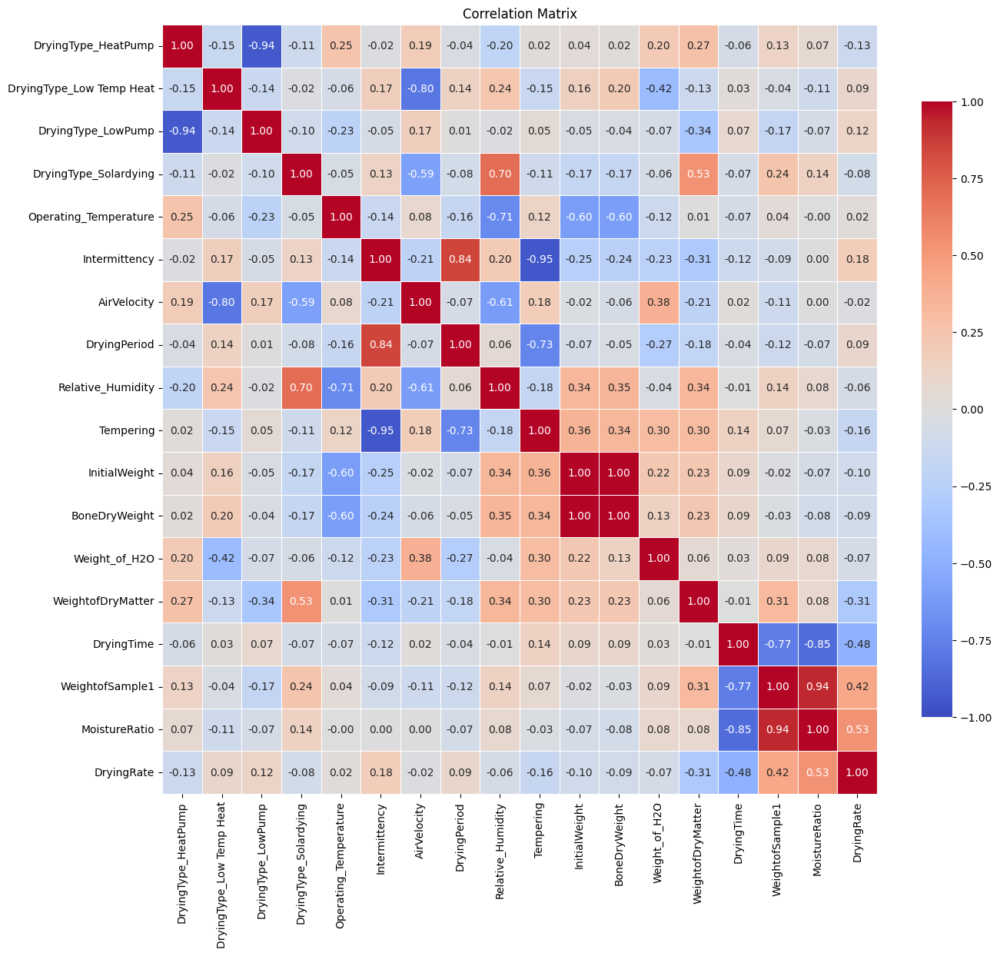

In [17]:
# Set up the matplotlib figure
plt.figure(figsize=(15, 13))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, linewidths=.5, cbar_kws={"shrink": .8})

# Customize the plot
plt.title('Correlation Matrix')
plt.show()

In [18]:
# Extract the column names of the training features and store them in the 'feature_names' variable
feature_names = X_train.columns

In [19]:
X_train=X_train.values
X_test=X_test.values

In [20]:
# Print the names of the features used in the training set
print(feature_names)

Index(['DryingType_HeatPump', 'DryingType_Low Temp Heat', 'DryingType_LowPump',
       'DryingType_Solardying', 'Operating_Temperature', 'Intermittency',
       'AirVelocity', 'DryingPeriod', 'Relative_Humidity', 'Tempering',
       'InitialWeight', 'BoneDryWeight', 'Weight_of_H2O', 'WeightofDryMatter',
       'DryingTime', 'WeightofSample1', 'MoistureRatio', 'DryingRate'],
      dtype='object')


In [21]:
Y_test

,MoistureContent
225,0.110563
541,0.240741
308,1.052805
511,0.103448
471,0.454296
...,...
421,1.634488
210,0.341782
192,0.103448
22,0.555211


In [22]:
X_train

array([[0.        , 0.        , 1.        , ..., 0.12306974, 0.07021132,
        0.03028869],
       [1.        , 0.        , 0.        , ..., 0.31337092, 0.26158301,
        0.05542924],
       [0.        , 0.        , 1.        , ..., 0.43328246, 0.71987372,
        0.33053366],
       ...,
       [1.        , 0.        , 0.        , ..., 0.37628555, 0.59898108,
        0.09886188],
       [1.        , 0.        , 0.        , ..., 0.03710717, 0.00198413,
        0.0572465 ],
       [1.        , 0.        , 0.        , ..., 0.39030118, 0.62795858,
        0.0683547 ]])

# Artificial Neural Network

In [123]:
# Define a function to create the Keras model
def build_keras_model(optimizer='adam', activation_function='relu', num_neurons=16):
    # Initialize the Sequential model
    model = Sequential()
    
    # Add the input layer with a specified number of neurons and activation function
    model.add(Dense(num_neurons, input_dim=X_train.shape[1], activation=activation_function))
    
    # Add a hidden layer with 8 neurons and the specified activation function
    model.add(Dense(8, activation=activation_function))
    
    # Add the output layer with a single neuron for regression
    model.add(Dense(1))
    
    # Compile the model with the specified optimizer, loss function, and metrics
    model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mean_squared_error'])
    
    return model

# Wrap the Keras model with KerasRegressor to be used with scikit-learn's GridSearchCV
keras_regressor = KerasRegressor(model=build_keras_model, verbose=0)

# Define the grid of hyperparameters to search
hyperparameter_grid = {
    'batch_size': [10, 20],
    'epochs': [20, 30],
    'optimizer': ['adam']
}

# Set up GridSearchCV with the KerasRegressor and the hyperparameter grid
grid_search = GridSearchCV(estimator=keras_regressor, param_grid=hyperparameter_grid, n_jobs=-1, cv=3)

# Fit the grid search to the training data
grid_search_result = grid_search.fit(X_train, Y_train.values.ravel())

# Display the best hyperparameters and the corresponding score
print(f"Best: {grid_search_result.best_score_} using {grid_search_result.best_params_}")

# Retrieve the best model from the grid search
best_model_ann = grid_search_result.best_estimator_

# Predict the target values on the test set using the best model
predicted_y = best_model_ann.predict(X_test)

# Print the actual target values
print(Y_test.values.ravel())

# Calculate residuals by subtracting the predicted values from the actual values
residuals = Y_test.values.ravel() - predicted_y


Best: 0.9262728778602112 using {'batch_size': 10, 'epochs': 30, 'optimizer': 'adam'}
[0.11056271 0.24074074 1.05280528 0.10344828 0.45429553 0.16147688
 0.38124701 0.84863636 0.48731004 2.1300032  0.14257841 2.7173391
 0.29514245 1.88659794 3.00592154 0.25038521 0.32591715 0.4833589
 2.12655087 0.98297253 1.55259093 1.88566532 2.2496798  0.75257332
 1.0997151  1.83394834 1.57200811 0.87901087 1.92277228 0.26352298
 0.95473603 1.36725997 0.44305574 3.0487512  1.25379927 2.005904
 0.38008547 0.65478114 0.29909513 0.85801217 1.6280369  0.23222181
 1.57534104 1.55230368 1.63575775 1.74144101 0.41910632 0.55414141
 0.11446128 1.8586973  0.20447293 0.39144478 0.17385522 1.37755776
 0.36523569 1.1663286  1.14082875 1.57568891 1.45262243 0.30512282
 0.7124171  1.41669081 0.62141094 0.34125413 0.97768715 1.41908365
 1.55989912 0.22061856 0.64935044 0.9267145  0.1685934  0.33049755
 1.88696766 1.30375471 0.48292683 0.31047822 0.64541311 2.03366337
 0.36241357 1.19801994 0.02593666 1.2752395  0.1

In [145]:
grid_search_result.best_params_

{'batch_size': 10, 'epochs': 30, 'optimizer': 'adam'}

In [24]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    mode='regression',  
    feature_names=feature_names
)

idx = 0
print(X_test[idx])
exp = explainer.explain_instance(X_test[idx], best_model_ann.predict)
exp.show_in_notebook(show_table=True, show_all=True)

[1.         0.         0.         0.         0.23076923 0.1625
 1.         0.         0.18238666 0.5        0.91304348 0.84130019
 0.68253968 0.55802574 0.8125     0.27007818 0.0120919  0.01156388]


In [25]:
# explainer_ann = shap.KernelExplainer(best_model_ann.predict, X_train)
# shap_values_ann = explainer_ann(X_test)
# # Visualize SHAP values for ANN


In [26]:
# shap.summary_plot(shap_values_ann, X_test,feature_names=feature_names)

# LSTM Model

In [27]:
def build_lstm_model(optimizer='adam'):
 
    model = Sequential([
        LSTM(120, activation='relu', input_shape=(X_train.shape[1], 1)),
        Dense(1)
    ])
    model.compile(optimizer=optimizer, loss='mean_squared_error')
    return model

In [28]:
# Create a KerasRegressor instance with predefined hyperparameters
keras_model = KerasRegressor(model=build_lstm_model, epochs=100, batch_size=10, verbose=0)

# Define the grid of hyperparameters to search
param_grid_keras = {
    'model__optimizer': ['adam', 'rmsprop'],
    'batch_size': [10, 20],
    'epochs': [50, 100]
}

# Set up GridSearchCV with the KerasRegressor and the hyperparameter grid
grid_lstm = GridSearchCV(estimator=keras_model, param_grid=param_grid_keras, cv=3, scoring='neg_mean_squared_error')

# Fit the grid search to the training data
grid_lstm.fit(X_train, Y_train.values.ravel())

# Print the best hyperparameters found by GridSearchCV
print(grid_lstm.best_params_)

{'batch_size': 10, 'epochs': 100, 'model__optimizer': 'adam'}


In [29]:
# Retrieve the best hyperparameters found by GridSearchCV
best_params_lstm = grid_lstm.best_params_

# Get the best Keras model based on the grid search results
best_model_lstm = grid_lstm.best_estimator_

# Predict the target values on the test set using the best model
predicted_y_lstm = best_model_lstm.predict(X_test)

# Print the predicted values from the best model
print(predicted_y_lstm)

# Print the actual target values from the test set
print(Y_test.values.ravel())

# Calculate the residuals by subtracting the predicted values from the actual values
residuals_lstm = Y_test.values.ravel() - predicted_y_lstm

[0.08466473 0.2998338  1.1802503  0.15358011 0.49890798 0.21436854
 0.57027197 0.81808233 0.45210934 2.0248158  0.17319544 2.4721327
 0.33932996 1.648729   2.684269   0.22088555 0.32497692 0.61929494
 1.8262187  0.9146694  1.4150752  1.79611    2.1265316  0.7490848
 1.1122265  1.6976855  1.4063997  0.80526763 1.9726777  0.35301322
 0.8793663  1.3074487  0.49349767 2.7609463  1.1247724  1.7553979
 0.4025107  0.6682109  0.40290368 0.7509048  1.5498954  0.31831813
 1.499675   1.3813857  1.459585   1.5530003  0.49030113 0.5903356
 0.09690218 1.7644209  0.25783157 0.6101145  0.22701593 1.4402056
 0.43868834 1.045472   1.0188589  1.5052909  1.3085281  0.50597984
 0.7107479  1.2759426  0.6821338  0.4435202  0.9692436  1.2975261
 1.4591999  0.27862334 0.47847015 0.86691356 0.20454748 0.5256555
 1.7813555  1.2543164  0.5098956  0.42295998 0.6799984  2.0097554
 0.48620003 1.3416939  0.14015685 1.1734738  0.12684147 1.7823988
 0.8931972  0.1806517  0.5617882  0.4196753  0.7662528  0.680286
 3.822

In [144]:
best_params_lstm

{'batch_size': 10, 'epochs': 100, 'model__optimizer': 'adam'}

In [30]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    mode='regression',  # or 'classification' for classification models
    feature_names=feature_names
)

idx = 0
exp = explainer.explain_instance(X_test[idx], best_model_lstm.predict)
exp.show_in_notebook(show_table=True, show_all=False)

In [31]:
# explainer_lstm = shap.KernelExplainer(best_model_lstm.predict, X_train)
# shap_values_lstm = explainer_lstm(X_test)


In [32]:
# # Visualize SHAP values for Gradient Boosting Regressor
# shap.summary_plot(shap_values_lstm, X_test,feature_names=feature_names)

# Random Forest Regressor 

In [33]:
# Define the grid of hyperparameters to search for the RandomForestRegressor
# 'n_estimators' specifies the number of trees in the forest
# 'max_features' determines the number of features to consider when looking for the best split
# 'max_depth' sets the maximum depth of each tree in the forest
param_grid_rf = {
    'n_estimators': [10, 50, 100],  # Number of trees in the forest
    'max_features': ['sqrt'],       # Number of features to consider for the best split (using 'sqrt' for square root of the total number of features)
    'max_depth': [10, 20]           # Maximum depth of each tree
}

# Initialize GridSearchCV with the RandomForestRegressor and the specified parameter grid
# 'cv=3' specifies 3-fold cross-validation
# 'scoring' specifies the metric to evaluate models ('neg_mean_squared_error' means negative mean squared error will be used for scoring)
grid_rf = GridSearchCV(estimator=RandomForestRegressor(), param_grid=param_grid_rf, cv=3, scoring='neg_mean_squared_error')

# Fit GridSearchCV on the training data
grid_rf.fit(X_train, Y_train.values.ravel())


GridSearchCV(cv=3, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [10, 20], 'max_features': ['sqrt'],
                         'n_estimators': [10, 50, 100]},
             scoring='neg_mean_squared_error')

In [34]:
# Retrieve the best hyperparameters found by GridSearchCV for the RandomForestRegressor
best_params_rf = grid_rf.best_params_

# Get the best RandomForestRegressor model based on the grid search results
best_model_rf = grid_rf.best_estimator_

# Predict the target values on the test set using the best RandomForestRegressor model
y_pred_model_rf = best_model_rf.predict(X_test)

# Print the predicted values from the best model
print(y_pred_model_rf)

# Print the actual target values from the test set
print(Y_test.values.ravel())

# Calculate the residuals by subtracting the predicted values from the actual values
# Residuals indicate the errors or deviations of the predictions from the actual values
residuals_rf = Y_test.values.ravel() - y_pred_model_rf


[0.11635654 0.23864052 1.10006046 0.12238982 0.45977093 0.15725263
 0.35120524 0.88493157 0.46635491 2.06854273 0.13919446 2.61080801
 0.29053724 1.86049424 2.614452   0.24839771 0.32337792 0.5043203
 1.99578786 0.99819092 1.45715805 1.86676464 2.15048255 0.7020443
 1.11826895 1.78078032 1.51255977 0.8482729  1.96216163 0.30735766
 0.96535715 1.409547   0.40921503 2.96030465 1.292489   1.93638417
 0.38318761 0.68396226 0.34084472 0.83604239 1.6310104  0.2363037
 1.55512791 1.47180151 1.54682806 1.78837747 0.45885109 0.6576449
 0.16664431 1.88150533 0.20703723 0.55483494 0.20283934 1.42984666
 0.40234054 1.12520022 1.09826837 1.54898296 1.43451056 0.29165985
 0.73420937 1.36728114 0.61306808 0.37898216 0.88538663 1.39659084
 1.49553785 0.20650875 0.65042294 0.95366133 0.17213483 0.33716009
 1.76052062 1.31752611 0.451021   0.34829063 0.68586425 2.03586772
 0.42521876 1.46147478 0.05333808 1.26269423 0.13172236 1.96686645
 1.00287024 0.22776722 0.650707   0.57149447 0.81436334 0.72720695

In [142]:
print(f"Best Parameters: {best_params_rf}")


Best Parameters: {'max_depth': 20, 'max_features': 'sqrt', 'n_estimators': 50}


In [35]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    mode='regression', 
    feature_names=feature_names
)

idx = 0
exp = explainer.explain_instance(X_test[idx], best_model_rf.predict)
exp.show_in_notebook(show_table=True, show_all=False)

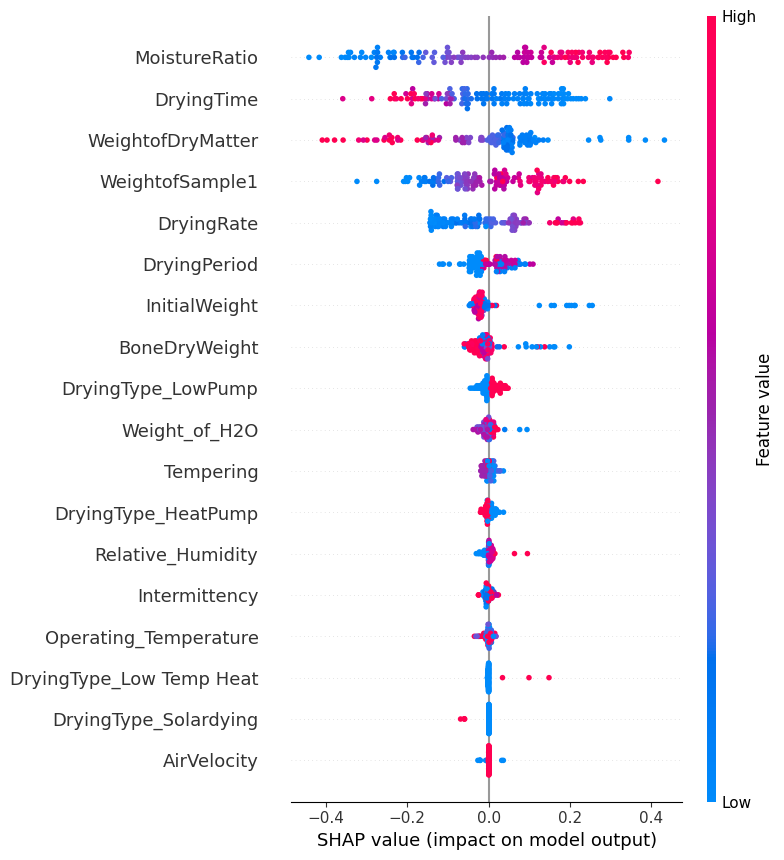

In [36]:
# SHAP for Gradient Boosting Regressor
explainer_rf = shap.TreeExplainer(best_model_rf, X_train)
shap_values_rf = explainer_rf(X_test,check_additivity=False)
# Visualize SHAP values for Gradient Boosting Regressor
shap.summary_plot(shap_values_rf, X_test,feature_names=feature_names)

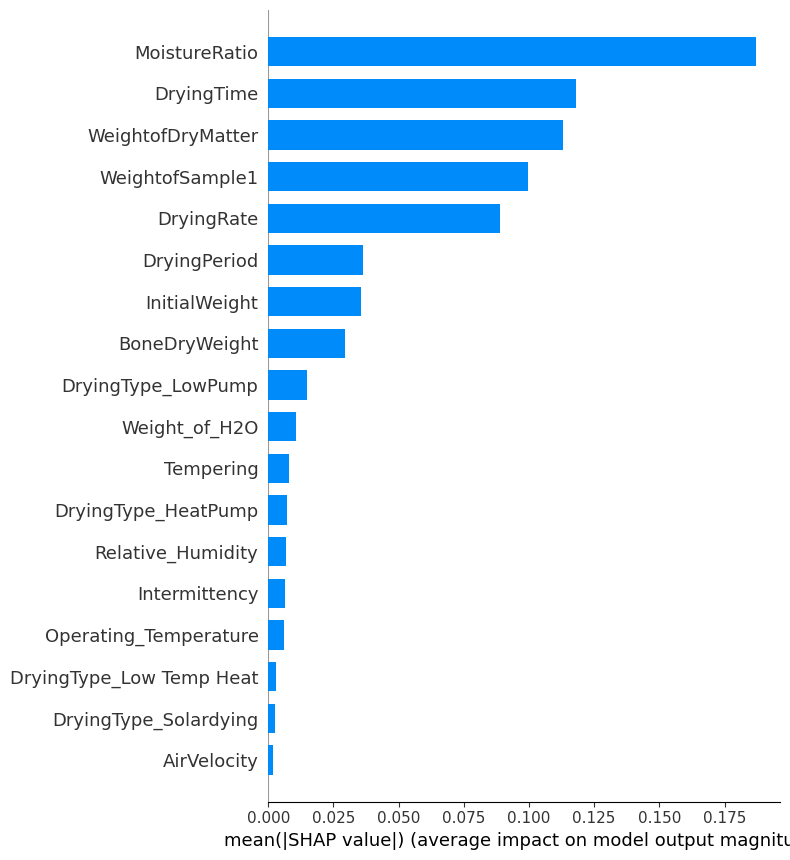

In [37]:
shap.summary_plot(shap_values_rf, X_test, plot_type="bar",feature_names=feature_names)

# Support Vector Machine 

In [38]:

# Define the grid of hyperparameters to search for the Support Vector Regressor (SVR)
# 'C' is the regularization parameter that controls the trade-off between achieving a low error on the training data and minimizing the model complexity
# 'gamma' defines how far the influence of a single training example reaches (only used for 'rbf', 'poly', and 'sigmoid' kernels)
# 'kernel' specifies the kernel type to be used in the algorithm (linear, radial basis function (rbf), or polynomial)
param_grid_svr = {
    'C': [0.1, 1],                  # Regularization parameter
    'gamma': ['scale', 'auto'],     # Kernel coefficient (gamma) for 'rbf', 'poly', and 'sigmoid' kernels
    'kernel': ['linear', 'rbf', 'poly']  # Type of kernel to be used in the SVR model
}

# Initialize GridSearchCV with the SVR estimator and the specified parameter grid
# 'cv=3' specifies 3-fold cross-validation
# 'scoring' specifies that the negative mean squared error should be used for evaluation
grid_svr = GridSearchCV(estimator=SVR(), param_grid=param_grid_svr, cv=3, scoring='neg_mean_squared_error')

# Fit GridSearchCV on the training data
grid_svr.fit(X_train, Y_train.values.ravel())

GridSearchCV(cv=3, estimator=SVR(),
             param_grid={'C': [0.1, 1], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'poly']},
             scoring='neg_mean_squared_error')

In [39]:
# Retrieve the best hyperparameters found by GridSearchCV for the Support Vector Regressor (SVR)
best_params_svr = grid_svr.best_params_

# Get the best SVR model based on the grid search results
best_model_svr = grid_svr.best_estimator_

# Predict the target values on the test set using the best SVR model
predicted_y_svr = best_model_svr.predict(X_test)

# Print the best hyperparameters found during the grid search
print(best_params_svr)

# Calculate the residuals by subtracting the predicted values from the actual values
residuals_svr = Y_test.values.ravel() - predicted_y_svr

{'C': 1, 'gamma': 'scale', 'kernel': 'poly'}


In [40]:
# SHAP for Gradient Boosting Regressor
explainer_svr = shap.KernelExplainer(best_model_svr.predict, X_train)
shap_values_svr = explainer_svr(X_test)
# Visualize SHAP values for Gradient Boosting Regressor

Using 516 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/129 [00:00<?, ?it/s]

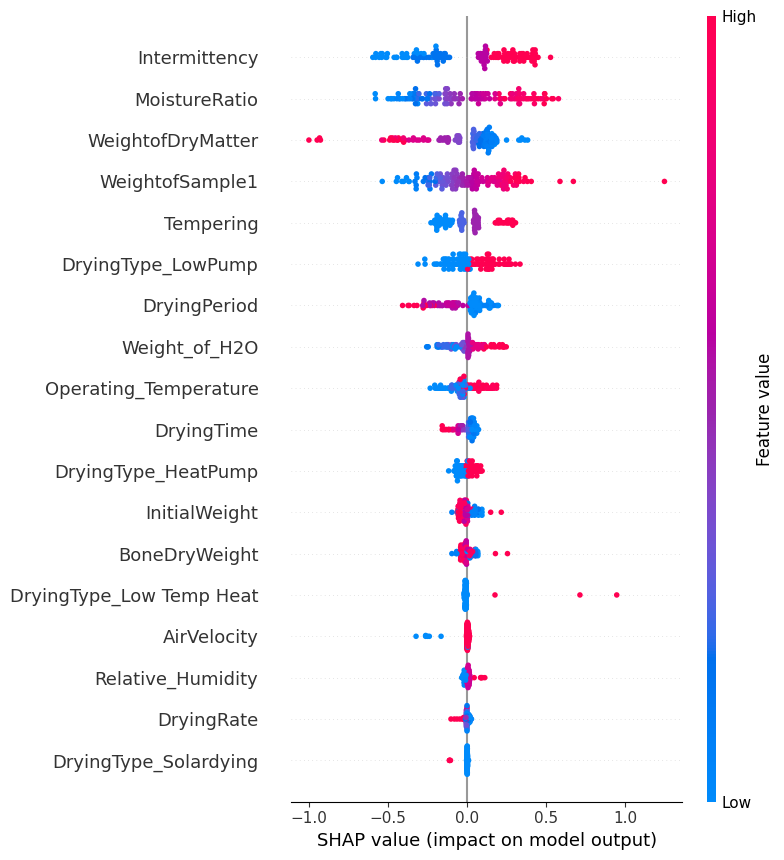

In [41]:
shap.summary_plot(shap_values_svr, X_test,feature_names=feature_names)

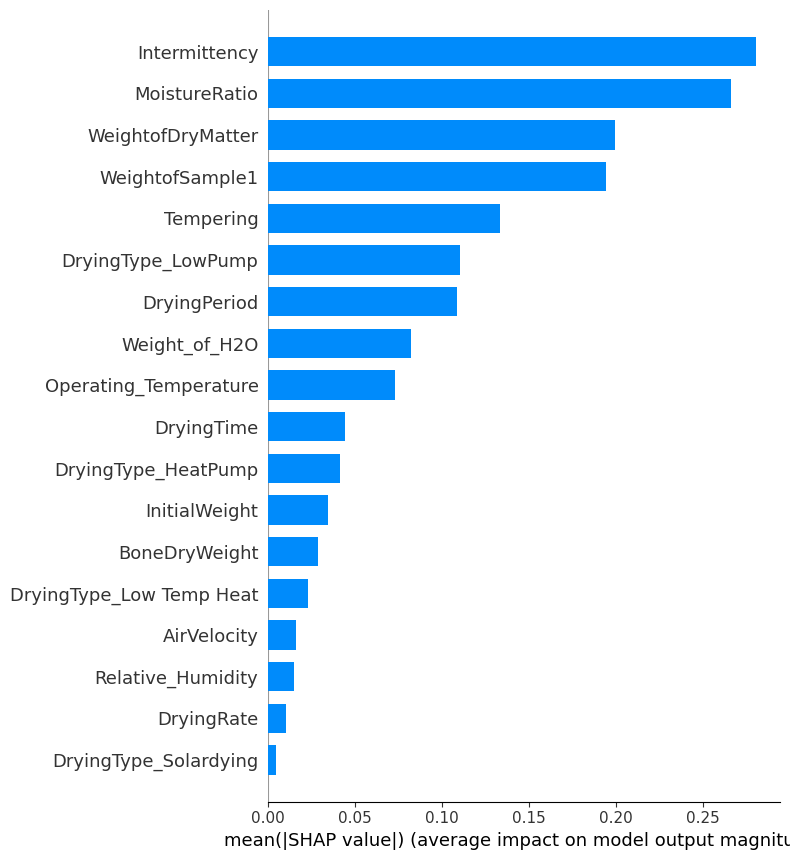

In [42]:
shap.summary_plot(shap_values_svr, X_test, plot_type="bar",feature_names=feature_names)

In [43]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    mode='regression',  # or 'classification' for classification models
    feature_names=feature_names
)

idx = 0
exp = explainer.explain_instance(X_test[idx], best_model_svr.predict)
exp.show_in_notebook(show_table=True, show_all=False)

# Gradient Boosting Regressor

In [44]:
# Define the grid of hyperparameters to search for the Gradient Boosting Regressor
# 'n_estimators' specifies the number of boosting stages to be run
# 'learning_rate' controls the contribution of each tree to the final model (shrinkage parameter)
param_grid = {
    'n_estimators': [20, 40],  # Number of boosting stages
    'learning_rate': [0.01, 0.1, 0.2, 0.3]  # Step size shrinking the contribution of each tree
}

# Initialize the Gradient Boosting Regressor
gbr = GradientBoostingRegressor()

# Set up GridSearchCV with the Gradient Boosting Regressor and the specified parameter grid
# 'cv=3' specifies 3-fold cross-validation
# 'scoring' specifies that negative mean squared error should be used for evaluation
# 'n_jobs=-1' allows parallel processing using all available CPUs
# 'verbose=1' enables detailed logging of the grid search progress
grid_search_gbr = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=1)

# Fit the grid search to the training data
grid_search_gbr.fit(X_train, Y_train.values.ravel())


Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.2, 0.3],
                         'n_estimators': [20, 40]},
             scoring='neg_mean_squared_error', verbose=1)

In [45]:
# Retrieve the best hyperparameters found by GridSearchCV for the Gradient Boosting Regressor
best_params_gbr = grid_search_gbr.best_params_

# Get the best Gradient Boosting Regressor model based on the grid search results
best_model_gbr = grid_search_gbr.best_estimator_

# Output the best hyperparameters found during the grid search
print(best_params_gbr)

# Output the best Gradient Boosting Regressor model
print(best_model_gbr)


{'learning_rate': 0.2, 'n_estimators': 40}
GradientBoostingRegressor(learning_rate=0.2, n_estimators=40)


In [46]:
# Use the best Gradient Boosting Regressor model to make predictions on the test set
predicted_y_gbr = best_model_gbr.predict(X_test)

# Print the predicted target values from the best model
print(predicted_y_gbr)

# Print the actual target values from the test set for comparison
print(Y_test.values.ravel())

# Calculate the residuals by subtracting the predicted values from the actual values
# Residuals represent the errors or deviations of the predictions from the true values
residuals_gbr = Y_test.values.ravel() - predicted_y_gbr


[0.07816622 0.27928188 1.0675466  0.12680129 0.44759058 0.14503724
 0.3770373  0.89944217 0.46534296 1.85865635 0.1498249  2.70404555
 0.35806818 1.80002222 2.69673951 0.27802584 0.2703039  0.48278814
 2.09575678 0.92841918 1.51552489 1.86285337 2.21891286 0.82393833
 1.13368743 1.81228432 1.65555999 0.83465003 2.00601488 0.24492132
 0.87963493 1.45251826 0.36468579 2.95257819 1.3034406  2.00352468
 0.38630817 0.60985317 0.36945205 0.82043482 1.7630506  0.25555747
 1.69083658 1.63290084 1.63983256 1.75202053 0.47804806 0.58276011
 0.10167764 1.86398984 0.24189227 0.42628919 0.12723316 1.46121498
 0.31008101 1.0413086  1.0413086  1.53765561 1.51803197 0.33015451
 0.78723109 1.4081919  0.59591866 0.39379752 0.92708035 1.42512121
 1.54971204 0.1753447  0.60814928 0.83293934 0.18015493 0.3505947
 1.78471459 1.37210181 0.48399485 0.36945205 0.70446892 2.05047571
 0.39323717 1.27053451 0.04530994 1.28276576 0.11173478 2.00663872
 1.01832924 0.25567778 0.76647416 0.55890408 0.83465003 0.81323

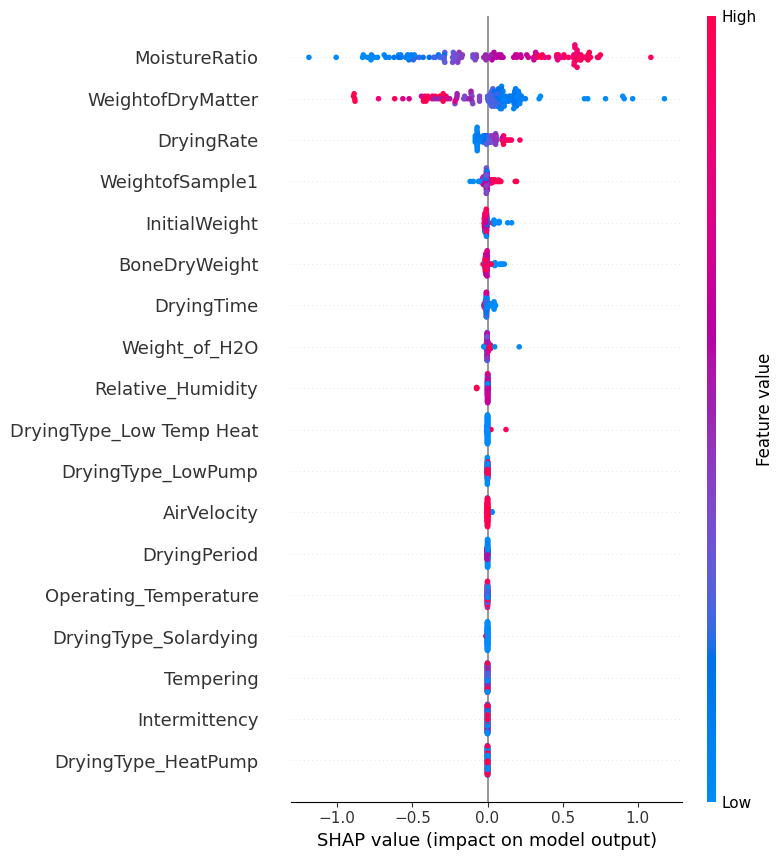

In [47]:
# SHAP for Gradient Boosting Regressor
explainer_gbr = shap.Explainer(best_model_gbr, X_train)
shap_values_gbr = explainer_gbr(X_test,check_additivity=False)
# Visualize SHAP values for Gradient Boosting Regressor
shap.summary_plot(shap_values_gbr, X_test,feature_names=feature_names)

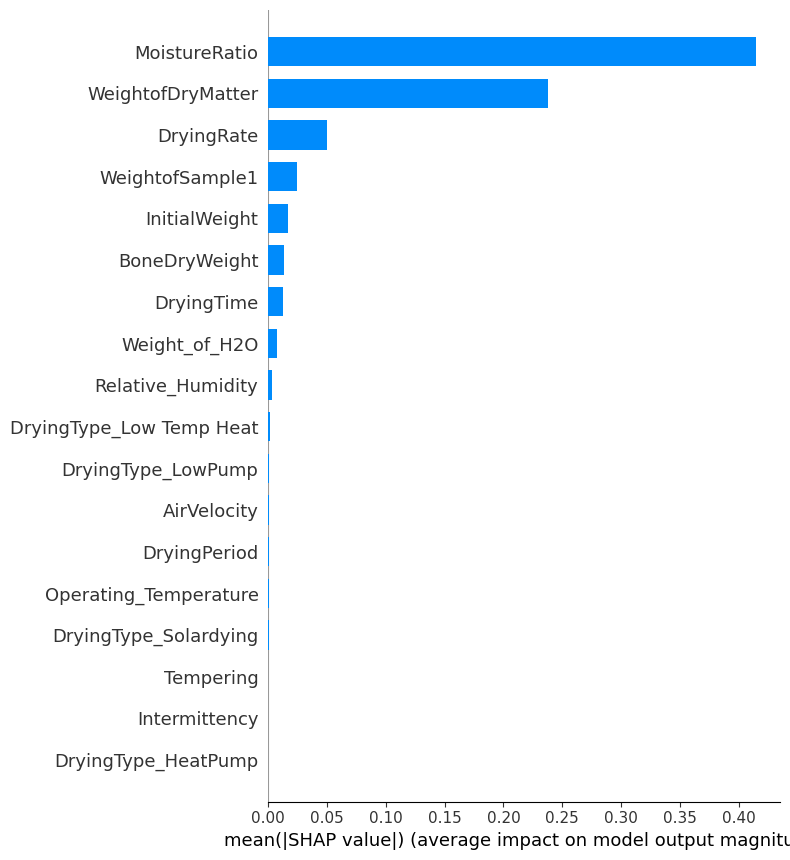

In [48]:
shap.summary_plot(shap_values_gbr, X_test, plot_type="bar",feature_names=feature_names)

In [49]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    mode='regression',  # or 'classification' for classification models
    feature_names=feature_names
)

idx = 0
exp = explainer.explain_instance(X_test[idx], best_model_gbr.predict)
exp.show_in_notebook(show_table=True, show_all=False)

# Adaboost Regressor

In [50]:


# Define the grid of hyperparameters to search for the AdaBoost Regressor
# 'base_estimator__max_depth' specifies the maximum depth of the decision tree used as the base estimator
# 'n_estimators' specifies the number of boosting stages (i.e., number of trees in the ensemble)
param_grid_adaboost_regressor = {
    'base_estimator__max_depth': [2, 4, 6, 8],  # Depth of the base decision tree
    'n_estimators': [50, 100, 200]  # Number of boosting stages (trees)
}

# Define the base regressor for AdaBoost, which is a decision tree
# This decision tree will be used as the weak learner in the AdaBoost algorithm
base_regressor = DecisionTreeRegressor()

# Define the AdaBoost Regressor
# AdaBoost will use the base regressor and boost its performance by combining multiple weak learners
adaboost_regressor = AdaBoostRegressor(base_estimator=base_regressor, random_state=42)

# Set up GridSearchCV with the AdaBoost Regressor and the parameter grid
# 'cv=3' specifies 3-fold cross-validation to evaluate each combination of hyperparameters
# 'scoring' specifies that negative mean squared error should be used for evaluation
grid_search_adaboost_regressor = GridSearchCV(estimator=adaboost_regressor,
                                              param_grid=param_grid_adaboost_regressor,
                                              cv=3,
                                              scoring='neg_mean_squared_error')

# Fit GridSearchCV to the training data to find the best combination of hyperparameters for the AdaBoost Regressor
grid_search_adaboost_regressor.fit(X_train, Y_train.values.ravel())

# Retrieve the best hyperparameters found by GridSearchCV
best_params_adaboost_regressor = grid_search_adaboost_regressor.best_params_

# Get the best AdaBoost Regressor model based on the grid search results
best_model_adaboost_regressor = grid_search_adaboost_regressor.best_estimator_

# Print the best hyperparameters found during the grid search
print(f"Best Parameters: {best_params_adaboost_regressor}")

# Use the best AdaBoost Regressor model to make predictions on the test set
y_pred_adaboost = best_model_adaboost_regressor.predict(X_test)

# Calculate the residuals by subtracting the predicted values from the actual values
# Residuals represent the errors or deviations of the predictions from the true values
residuals_adaboost = Y_test.values.ravel() - y_pred_adaboost


`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
`base_estimator` was renamed to `estimator`

Best Parameters: {'base_estimator__max_depth': 4, 'n_estimators': 200}


In [51]:
best_model_adaboost_regressor
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    mode='regression',  # or 'classification' for classification models
    feature_names=feature_names
)

idx = 0
exp = explainer.explain_instance(X_test[idx], best_model_adaboost_regressor.predict)
exp.show_in_notebook(show_table=True, show_all=False)

PermutationExplainer explainer: 130it [01:57,  1.05it/s]                                                                                                                                                          


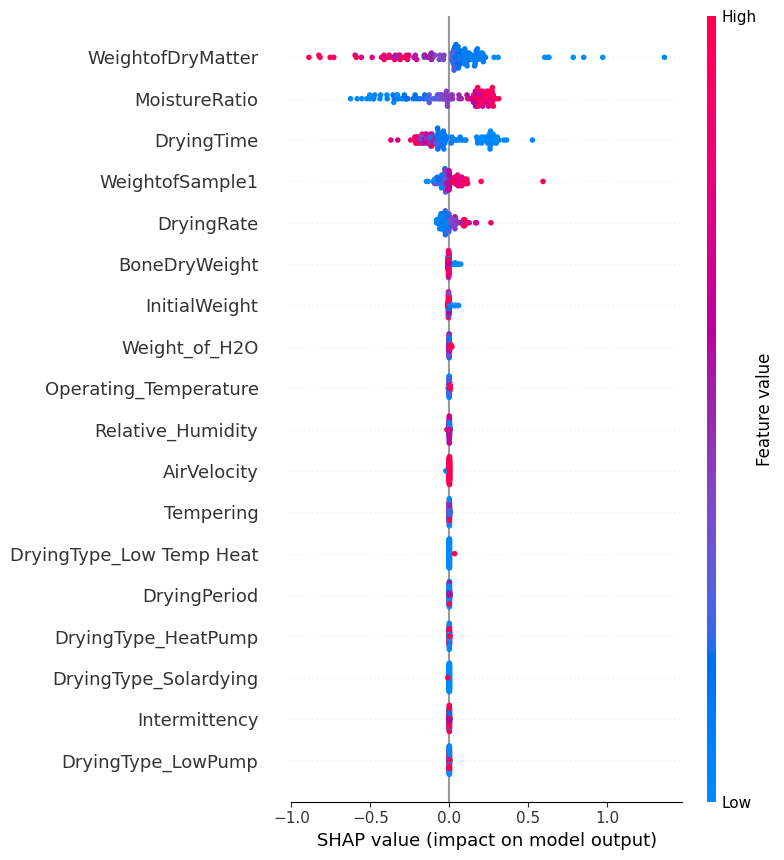

In [52]:
explainer_adaboost = shap.Explainer(best_model_adaboost_regressor.predict, X_train)
shap_values_adaboost = explainer_adaboost(X_test)

# Visualize SHAP values for ANN
shap.summary_plot(shap_values_adaboost, X_test,feature_names=feature_names)

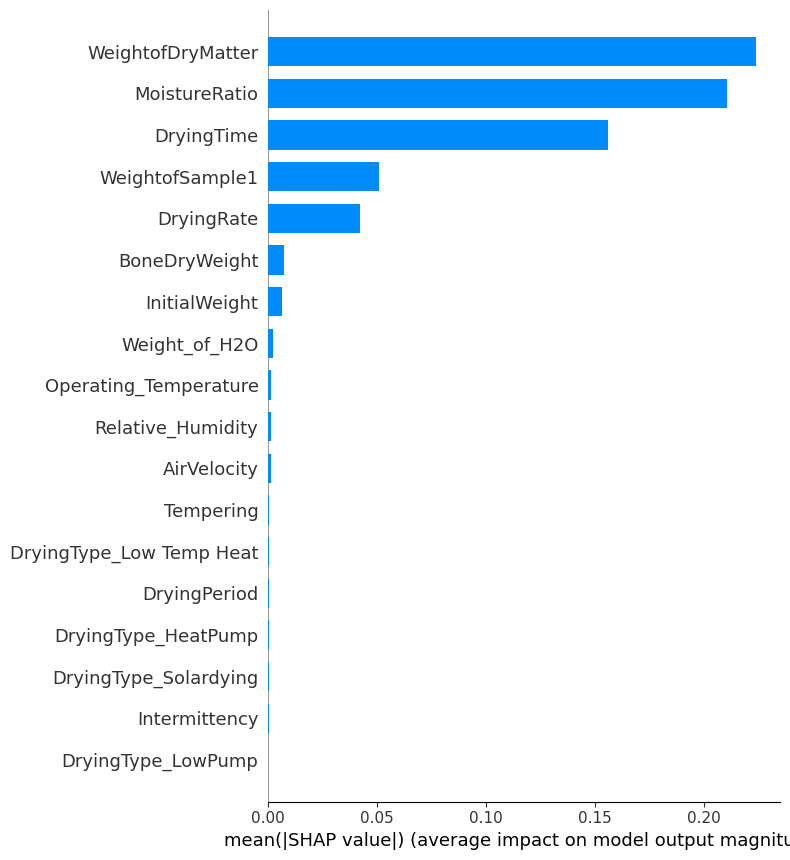

In [53]:
shap.summary_plot(shap_values_adaboost, X_test, plot_type="bar",feature_names=feature_names)

# XGBBoost Regressor

In [124]:

# Define the grid of hyperparameters to search for the CatBoost Regressor
param_grid_xgboost = {
    'n_estimators': [50, 80],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

# Initialize the XGBoost Regressor
xgboost_regressor = XGBRegressor(random_state=42, verbose=0)  # `verbose=0` to suppress training output

# Set up GridSearchCV with the CatBoost Regressor and the parameter grid
grid_search_xgboost = GridSearchCV(estimator=xgboost_regressor,
                                    param_grid=param_grid_xgboost,
                                    cv=3,  # 3-fold cross-validation
                                    scoring='neg_mean_squared_error')  # Use negative mean squared error for scoring

# Fit GridSearchCV to the training data to find the best combination of hyperparameters for the CatBoost Regressor
grid_search_xgboost.fit(X_train, Y_train.values.ravel())

# Retrieve the best hyperparameters found by GridSearchCV
best_params_xgboost = grid_search_xgboost.best_params_

# Get the best CatBoost Regressor model based on the grid search results
best_model_xgboost = grid_search_xgboost.best_estimator_

# Print the best hyperparameters found during the grid search
print(f"Best Parameters: {best_params_xgboost}")

# Use the best CatBoost Regressor model to make predictions on the test set
y_pred_xgboost = best_model_xgboost.predict(X_test)

# Calculate the residuals by subtracting the predicted values from the actual values
residuals_xgboost = Y_test.values.ravel() - y_pred_xgboost

[22:30:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:30:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:30:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:30:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:30:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:30:37] WARN

Best Parameters: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 80}


[22:30:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:30:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:30:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:30:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:30:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:30:38] WARN

In [141]:
print(f"Best Parameters: {best_params_xgboost}")


Best Parameters: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 80}


In [55]:

explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    mode='regression',  # or 'classification' for classification models
    feature_names=feature_names
)

idx = 0
exp = explainer.explain_instance(X_test[idx], best_model_xgboost.predict)
exp.show_in_notebook(show_table=True, show_all=False)

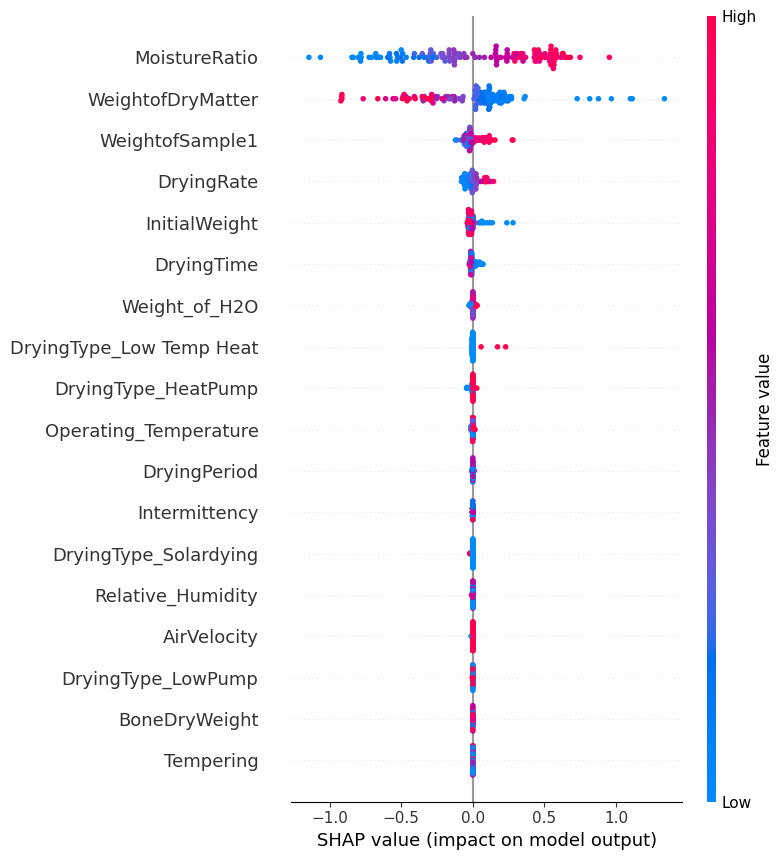

In [56]:
explainer_xgboost = shap.Explainer(best_model_xgboost.predict, X_train)
shap_values_xgboost = explainer_xgboost(X_test)

# Visualize SHAP values for ANN
shap.summary_plot(shap_values_xgboost, X_test,feature_names=feature_names)

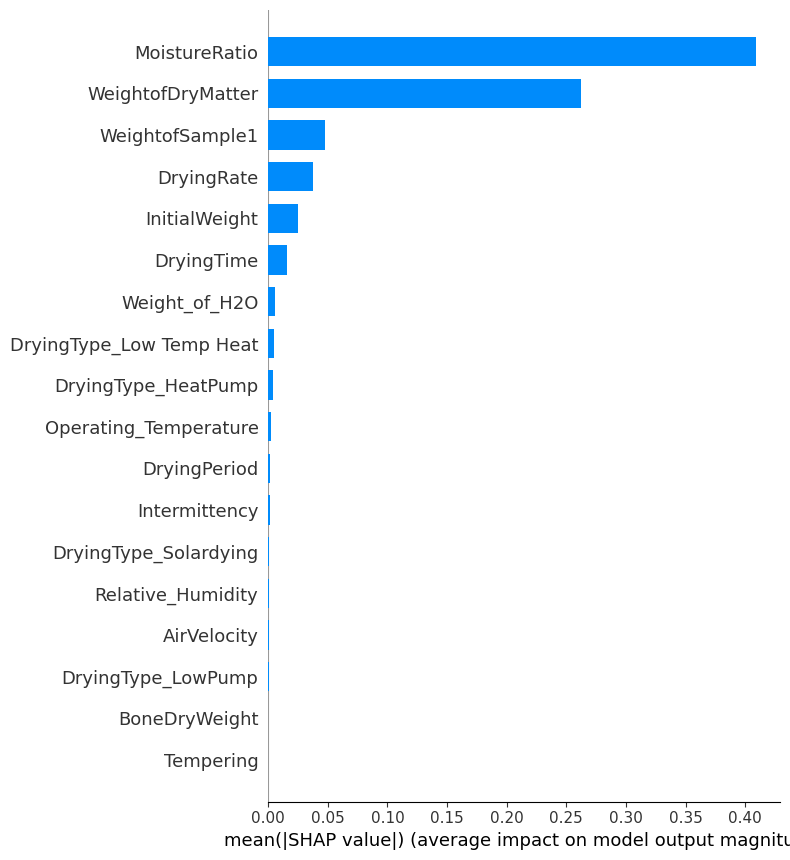

In [57]:
shap.summary_plot(shap_values_xgboost, X_test, plot_type="bar",feature_names=feature_names)

# Voting Regressor

In [125]:
# Initialize a Voting Regressor with the best models from different algorithms
# Voting Regressor combines multiple regression models to improve predictions by averaging their results
voting_regressor = VotingRegressor(
    estimators=[
        ('Artificial Neural Network', best_model_ann),  # Artificial Neural Network model
        ('XGBoost Boosting', best_model_xgboost),           # CatBoost Boosting model
        ('LSTM Neural Network', grid_lstm.best_estimator_)  # LSTM Neural Network model from the Keras grid search
    ]
)

# Define the grid of hyperparameters to search for the Voting Regressor
# 'weights' specify the relative importance of each model in the voting regressor
param_grid = {
    'weights': [  [0.3, 0.4, 0.3], [0.25, 0.5, 0.25]]
}

# Set up GridSearchCV with the Voting Regressor and the specified parameter grid
# 'cv=3' specifies 3-fold cross-validation to evaluate each combination of hyperparameters
grid = GridSearchCV(voting_regressor, param_grid, cv=3)

# Fit GridSearchCV to the training data to find the best combination of weights for the Voting Regressor
try:
    grid.fit(X_train, Y_train.values.ravel())
    # Print the best combination of weights found by GridSearchCV
    print("Best parameters:", grid.best_params_)
except Exception as e:
    # Log any errors encountered during the grid search
    logging.error("Error occurred during GridSearchCV", exc_info=True)

# Retrieve the best Voting Regressor model based on grid search results
best_voting_regressor = grid.best_estimator_

# Predict the target values on the test set using the best Voting Regressor model
voting_predictions = best_voting_regressor.predict(X_test)

# Print the predictions made by the best Voting Regressor model
print(voting_predictions)

# Print the actual target values from the test set for comparison
print(Y_test.values.ravel())

# Calculate the residuals by subtracting the predicted values from the actual values
# Residuals represent the errors or deviations of the predictions from the true values
residuals_voting = Y_test.values.ravel() - voting_predictions




[22:30:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:31:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:31:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:32:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:32:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

[22:33:06] WARN

Best parameters: {'weights': [0.3, 0.4, 0.3]}
[0.09388144 0.22794861 1.08235929 0.12110281 0.46806927 0.16244614
 0.37826324 0.83766829 0.43522369 2.09471662 0.15145142 2.61464798
 0.28764797 1.84637095 2.97747521 0.25097868 0.33068863 0.51669886
 2.18068857 0.9812416  1.49689939 1.86161817 2.21523876 0.75227136
 1.12699683 1.84294912 1.57782936 0.83594999 1.94063472 0.27582921
 0.92173045 1.41596495 0.44319994 2.95941651 1.24780513 2.0849357
 0.37224689 0.63636848 0.30852779 0.82584177 1.71104056 0.25890287
 1.67232548 1.54356685 1.63313874 1.71702868 0.4374348  0.53234407
 0.10706995 1.86734406 0.19429341 0.44263799 0.15938591 1.40073814
 0.35868377 1.12551658 1.10769362 1.56303204 1.437032   0.30360324
 0.73582464 1.41091828 0.65477553 0.36128633 0.95947729 1.3851398
 1.55060027 0.21013403 0.63080061 0.89558424 0.18083673 0.31977697
 1.80740353 1.34886694 0.47076511 0.31900996 0.62466776 2.04547853
 0.38522013 1.29478769 0.07500261 1.21539369 0.11522534 1.9905634
 0.95407115 0.22060

In [59]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    mode='regression',  # or 'classification' for classification models
    feature_names=feature_names
)

idx = 0
exp = explainer.explain_instance(X_test[idx], best_voting_regressor.predict)
exp.show_in_notebook(show_table=True, show_all=False)

# Residual Graph

In [126]:
len(predicted_y_lstm.ravel())

129

In [127]:
len(residuals_lstm)

129

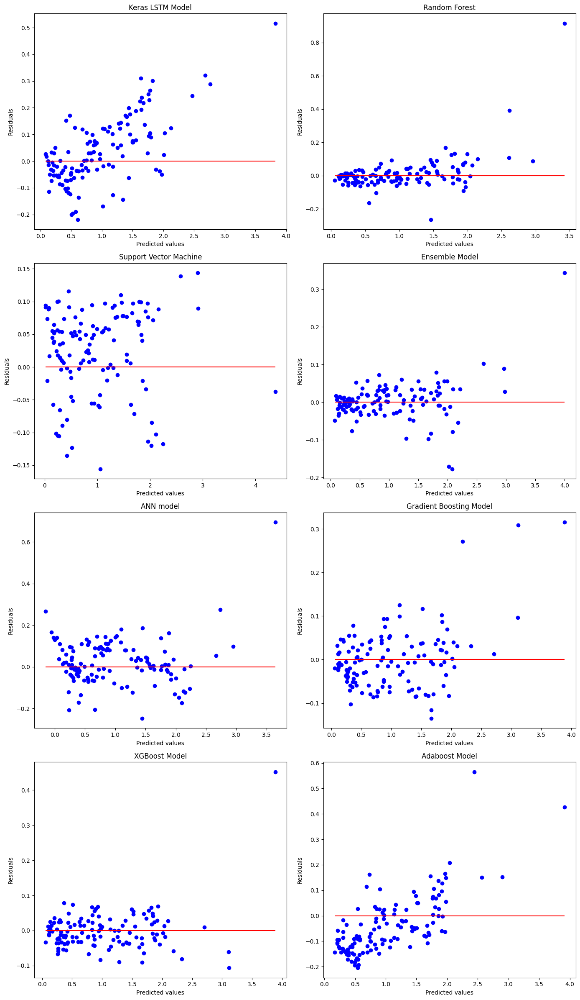

In [128]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 24))  # Adjusted figure size for better display

# Residual plot for Model 1
plt.subplot(4, 2, 1)
plt.scatter(predicted_y_lstm.ravel(), residuals_lstm.ravel(), color='blue')
plt.hlines(0, min(predicted_y_lstm), max(predicted_y_lstm), colors='red')
plt.title('Keras LSTM Model')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Residual plot for Model 2
plt.subplot(4, 2, 2)
plt.scatter(y_pred_model_rf, residuals_rf, color='blue')
plt.hlines(0, min(y_pred_model_rf), max(y_pred_model_rf), colors='red')
plt.title('Random Forest')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Residual plot for Model 3
plt.subplot(4, 2, 3)
plt.scatter(predicted_y_svr, residuals_svr, color='blue')
plt.hlines(0, min(predicted_y_svr), max(predicted_y_svr), colors='red')
plt.title('Support Vector Machine')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Residual plot for Model 4
plt.subplot(4, 2, 4)
plt.scatter(voting_predictions, residuals_voting, color='blue')
plt.hlines(0, min(voting_predictions), max(voting_predictions), colors='red')
plt.title('Ensemble Model')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Additional subplots for new models (assuming you have the data)
# Model 5
plt.subplot(4, 2, 5)
plt.scatter(predicted_y, residuals, color='blue')
plt.hlines(0, min(predicted_y), max(predicted_y), colors='red')
plt.title('ANN model')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Model 6
plt.subplot(4, 2, 6)
plt.scatter(y_pred_xgboost, residuals_gbr, color='blue')
plt.hlines(0, min(y_pred_xgboost), max(y_pred_xgboost), colors='red')
plt.title('Gradient Boosting Model')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Model 7
plt.subplot(4, 2, 7)
plt.scatter(y_pred_xgboost, residuals_xgboost, color='blue')
plt.hlines(0, min(y_pred_xgboost), max(y_pred_xgboost), colors='red')
plt.title('XGBoost Model')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Model 8
plt.subplot(4, 2, 8)
plt.scatter(y_pred_adaboost, residuals_adaboost, color='blue')
plt.hlines(0, min(y_pred_adaboost), max(y_pred_adaboost), colors='red')
plt.title('Adaboost Model')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.tight_layout()  # Adjust layout to fit the new subplots
plt.show()


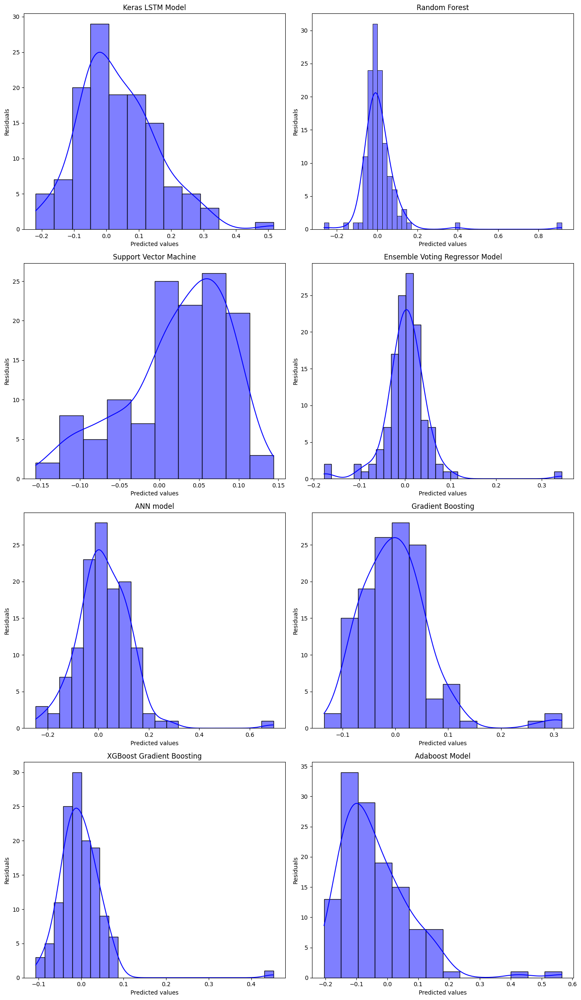

In [129]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 24))  # Increased figure size for better visibility

# Residual plot for Model 1
plt.subplot(4, 2, 1)
sns.histplot(residuals_lstm.ravel(), kde=True, color='blue')
plt.title('Keras LSTM Model')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Residual plot for Model 2
plt.subplot(4, 2, 2)
sns.histplot(residuals_rf, kde=True, color='blue')
plt.title('Random Forest')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Residual plot for Model 3
plt.subplot(4, 2, 3)
sns.histplot(residuals_svr, kde=True, color='blue')
plt.title('Support Vector Machine')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Residual plot for Model 4
plt.subplot(4, 2, 4)
sns.histplot(residuals_voting, kde=True, color='blue')
plt.title('Ensemble Voting Regressor Model')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Additional subplots for new models (assuming you have the data)
# Model 5
plt.subplot(4, 2, 5)
sns.histplot(residuals, kde=True, color='blue')
plt.title('ANN model')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Model 6
plt.subplot(4, 2, 6)
sns.histplot(residuals_gbr, kde=True, color='blue')
plt.title('Gradient Boosting')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Model 7
plt.subplot(4, 2, 7)
sns.histplot(residuals_xgboost, kde=True, color='blue')
plt.title('XGBoost Gradient Boosting')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

# Model 8
plt.subplot(4, 2, 8)
sns.histplot(residuals_adaboost, kde=True, color='blue')
plt.title('Adaboost Model')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.tight_layout()  # Adjust layout to fit the new subplots
plt.show()


# Calculate the Variance of each model

In [130]:
import numpy as np

# Calculate the variance of the residuals for each model
# Variance helps in assessing the spread of the residuals; lower variance indicates better model performance

# Variance of residuals for Model 1 (e.g., Neural Network Model)
variance_model_lstm = np.var(residuals_lstm)

# Variance of residuals for Model 2 (e.g., Random Forest Model)
variance_model_rf = np.var(residuals_rf)

# Variance of residuals for Model 3 (e.g., Support Vector Regression Model)
variance_model_svr = np.var(residuals_svr)

# Variance of residuals for the Stacked Model (combination of models)
variance_model_voting = np.var(residuals_voting)

# Variance of residuals for Model 5 (e.g., Gradient Boosting Regressor Model)
variance_model_gbr = np.var(residuals_gbr)

# Variance of residuals for Model 7 (e.g., AdaBoost Regressor Model)
variance_model_adboost = np.var(residuals_adaboost)
# Variance of residuals for Model 7 (e.g., CatBoost Regressor Model)
variance_model_xgboost = np.var(residuals_xgboost)

# Print the variance of residuals for each model to compare their performance
print(f'Variance of LSTM residuals for Model 1: {variance_model_lstm:.4f}')
print(f'Variance of Random Forest residuals for Model 2: {variance_model_rf:.4f}')
print(f'Variance of  Support Vector Machine residuals for Model 3: {variance_model_svr:.4f}')
print(f'Variance of residuals for Voting  Model: {variance_model_voting:.4f}')
print(f'Variance of Gradient Boosting residuals for Model 5: {variance_model_gbr:.4f}')
print(f'Variance of Adaboost residuals for Model 7: {variance_model_adboost:.4f}')
print(f'Variance of CatBoost residuals for Model 7: {variance_model_xgboost:.4f}')



Variance of LSTM residuals for Model 1: 0.0147
Variance of Random Forest residuals for Model 2: 0.0106
Variance of  Support Vector Machine residuals for Model 3: 0.0042
Variance of residuals for Voting  Model: 0.0025
Variance of Gradient Boosting residuals for Model 5: 0.0048
Variance of Adaboost residuals for Model 7: 0.0133
Variance of CatBoost residuals for Model 7: 0.0031


# Evaluation of Model

In [131]:
def plot_best_fit(y_true, y_pred,model_name):
    ax.scatter(y_pred, y_true, color='blue', label='Actual data') 

In [132]:
svr_predictions = best_model_svr.predict(X_test)
rf_predictions = best_model_rf.predict(X_test)
lstm_predictions = best_model_lstm.predict(X_test)
gbr_predictions = best_model_gbr.predict(X_test)
adaboost_reg_predictions = best_model_adaboost_regressor.predict(X_test)
ann_reg_predictions = best_model_ann.predict(X_test)
voting_prediction=best_voting_regressor.predict(X_test)
xgboost_prediction=best_model_xgboost.predict(X_test)

In [133]:
# Evaluation of the model
from sklearn.metrics import mean_absolute_error
model_names=[] 
rmse_values=[] 
r2_accuracy=[] 
mse_accuracy=[] 
mape_accuracy=[]
adjusted_r2_accuracy=[]
mae_accuracy=[]
def calculate_mae(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mae_accuracy.append(mae)
 
    print(f'{model_name} - MAE: {mae:.10f}')

def adjusted_r2(y_true, y_pred, n, p):
    r2 = r2_score(y_true, y_pred)
    adj_r2 = 1 - ((1 - r2) * (n - 1)) / (n - p - 1)
    return adj_r2 
    
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true.values.ravel() - y_pred.ravel()) / y_true.values.ravel())) * 100
    
def evaluation_metrics(y_true, y_pred, model_name):
    mae=mean_absolute_error(y_true,y_pred)
    mape=calculate_mape(y_true,y_pred)
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    rmse = np.sqrt(mse)
    adj_r2 = adjusted_r2(y_true, y_pred, len(y_true), X.shape[1])
    print(f'{model_name} - MSE: {mse:.10f}, R^2: {r2:.10f}, RMSE:{rmse:.10f}, MAPE:{mape:.10f}, MAE:{mae:.10f}')
    model_names.append(model_name) 
    rmse_values.append(rmse) 
    r2_accuracy.append(r2)
    mse_accuracy.append(mse)
    mape_accuracy.append(mape)
    adjusted_r2_accuracy.append(adj_r2)
    # mae_accuracy.append(mae)




In [134]:
evaluation_metrics(Y_test, voting_predictions, 'Voting Ensemble')
evaluation_metrics(Y_test, svr_predictions, 'SVM Model')
evaluation_metrics(Y_test, rf_predictions, 'RF Model')
evaluation_metrics(Y_test, lstm_predictions, 'LSTM Model')
evaluation_metrics(Y_test, gbr_predictions, 'GBT Model')
evaluation_metrics(Y_test, adaboost_reg_predictions, 'Adaboost Model')
evaluation_metrics(Y_test, ann_reg_predictions, 'ANN Model')
evaluation_metrics(Y_test, xgboost_prediction, 'XGBoost Model')

Voting Ensemble - MSE: 0.0025424834, R^2: 0.9954365681, RMSE:0.0504230440, MAPE:5.5684767583, MAE:0.0307525351
SVM Model - MSE: 0.0047294092, R^2: 0.9915113163, RMSE:0.0687707004, MAPE:12.7946416650, MAE:0.0585275709
RF Model - MSE: 0.0106963604, R^2: 0.9808014032, RMSE:0.1034232104, MAPE:6.7043839848, MAE:0.0487971635
LSTM Model - MSE: 0.0159828973, R^2: 0.9713127468, RMSE:0.1264234838, MAPE:16.8278359979, MAE:0.0957621105
GBT Model - MSE: 0.0048450851, R^2: 0.9913036929, RMSE:0.0696066455, MAPE:8.0513660455, MAE:0.0493850495
Adaboost Model - MSE: 0.0148423043, R^2: 0.9733599650, RMSE:0.1218289963, MAPE:26.8781430228, MAE:0.0978254048
ANN Model - MSE: 0.0126629449, R^2: 0.9772716359, RMSE:0.1125297513, MAPE:22.1310259343, MAE:0.0788981434
XGBoost Model - MSE: 0.0030724531, R^2: 0.9944853403, RMSE:0.0554297131, MAPE:6.1885295364, MAE:0.0347577364


In [135]:
calculate_mae(Y_test, voting_predictions, 'Voting Ensemble')
calculate_mae(Y_test, svr_predictions, 'SVM Model')
calculate_mae(Y_test, rf_predictions, 'RF Model')
calculate_mae(Y_test, lstm_predictions, 'LSTM Model')
calculate_mae(Y_test, gbr_predictions, 'GBT Model')
calculate_mae(Y_test, adaboost_reg_predictions, 'Adaboost Model')
calculate_mae(Y_test, ann_reg_predictions, 'ANN Model')
calculate_mae(Y_test, xgboost_prediction, 'XGBoost Model')

Voting Ensemble - MAE: 0.0307525351
SVM Model - MAE: 0.0585275709
RF Model - MAE: 0.0487971635
LSTM Model - MAE: 0.0957621105
GBT Model - MAE: 0.0493850495
Adaboost Model - MAE: 0.0978254048
ANN Model - MAE: 0.0788981434
XGBoost Model - MAE: 0.0347577364


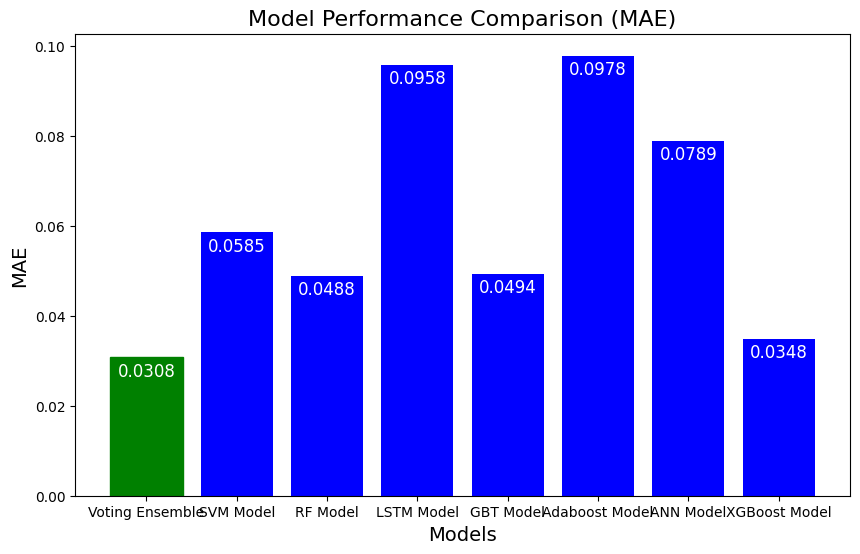

In [136]:
# Find the best model

best_model_index = np.argmin(mae_accuracy)
best_model_mae = mae_accuracy[best_model_index]

# Create a bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, mae_accuracy, color='blue')

# Highlight the best model in a different color
bars[best_model_index].set_color('green')

# Annotate RMSE values on the bars
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.003,
             f'{mae_accuracy[i]:.4f}', ha='center', va='center', color='white', fontsize=12)

# Add titles and labels
plt.title('Model Performance Comparison (MAE)', fontsize=16)
plt.xlabel('Models', fontsize=14)
plt.ylabel('MAE', fontsize=14)

# Display the plot
plt.show()

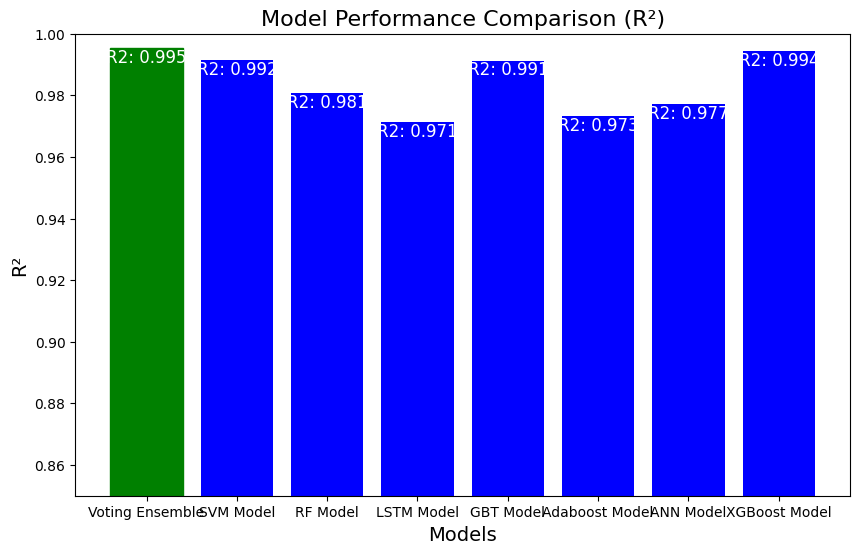

In [137]:
best_model_index = np.argmax(r2_accuracy)
best_model_r2 = r2_accuracy[best_model_index]
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, r2_accuracy, color='blue')
bars[best_model_index].set_color('green')
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.003,
             f'R2: {r2_accuracy[i]:.3f}', ha='center', va='center', color='white', fontsize=12)

plt.title('Model Performance Comparison (R²)', fontsize=16)
plt.xlabel('Models', fontsize=14)
plt.ylabel('R²', fontsize=14)
plt.ylim(0.85, 1.0)
plt.show()

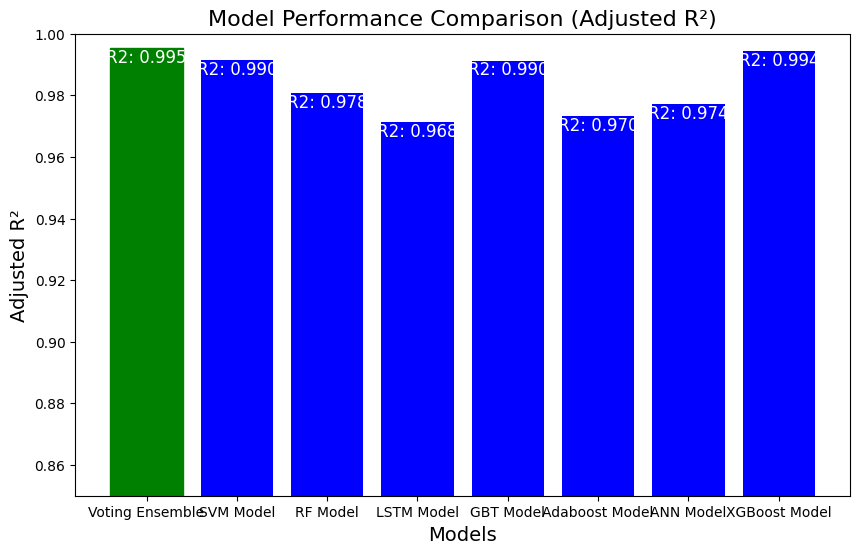

In [138]:
best_model_index = np.argmax(adjusted_r2_accuracy)
best_model_r2 = adjusted_r2_accuracy[best_model_index]
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, r2_accuracy, color='blue')
bars[best_model_index].set_color('green')
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.003,
             f'R2: {adjusted_r2_accuracy[i]:.3f}', ha='center', va='center', color='white', fontsize=12)

plt.title('Model Performance Comparison (Adjusted R²)', fontsize=16)
plt.xlabel('Models', fontsize=14)
plt.ylabel('Adjusted R²', fontsize=14)
plt.ylim(0.85, 1.0)
plt.show()

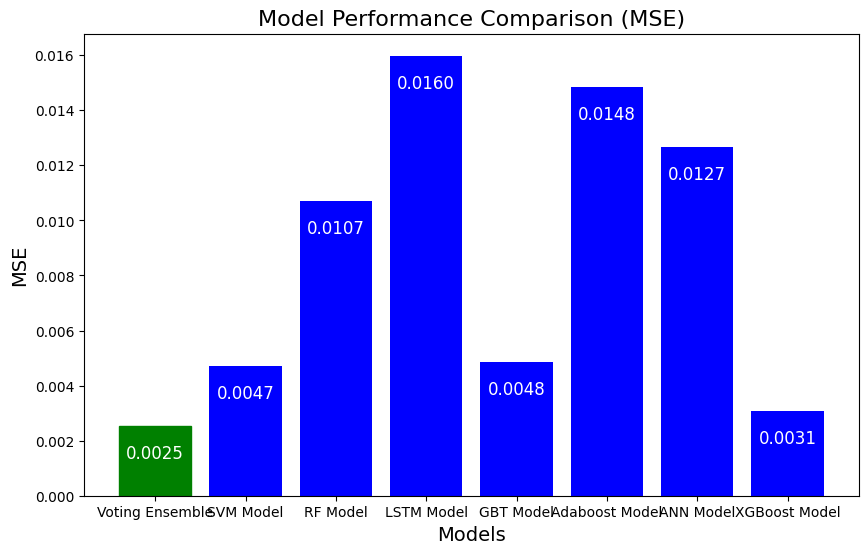

In [139]:
# Find the best model
best_model_index = np.argmin(mse_accuracy)
best_model_mse = mse_accuracy[best_model_index]

# Create a bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, mse_accuracy, color='blue')

# Highlight the best model in a different color
bars[best_model_index].set_color('green')

# Annotate RMSE values on the bars
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.001,
             f'{mse_accuracy[i]:.4f}', ha='center', va='center', color='white', fontsize=12)

# Add titles and labels
plt.title('Model Performance Comparison (MSE)', fontsize=16)
plt.xlabel('Models', fontsize=14)
plt.ylabel('MSE', fontsize=14)

# Display the plot
plt.show()


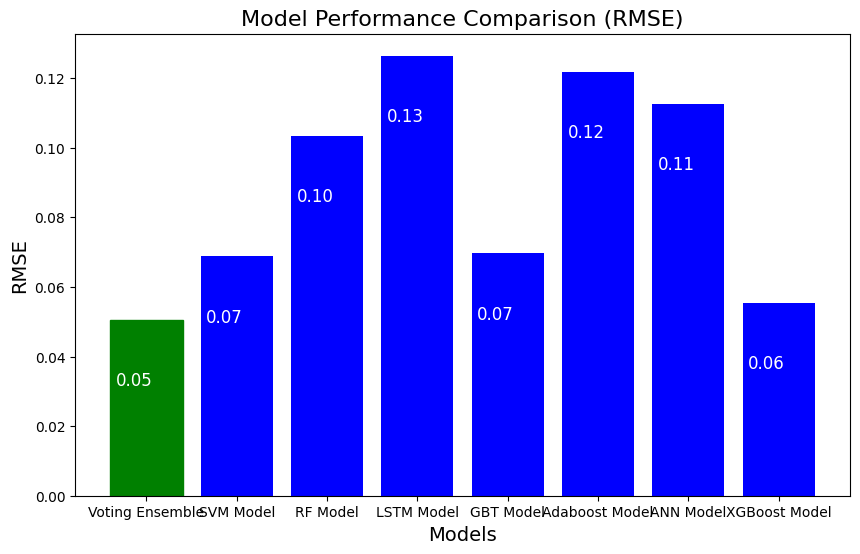

In [140]:
# Find the best model
best_model_index = np.argmin(rmse_values)
best_model_rmse = rmse_values[best_model_index]

# Create a bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, rmse_values, color='blue')

# Highlight the best model in a different color
bars[best_model_index].set_color('green')

# Annotate RMSE values on the bars
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width() / 3, bar.get_height() - 0.02,
             f'{rmse_values[i]:.2f}', ha='center', va='bottom', color='white', fontsize=12)

# Add titles and labels
plt.title('Model Performance Comparison (RMSE)', fontsize=16)
plt.xlabel('Models', fontsize=14)
plt.ylabel('RMSE', fontsize=14)

# Display the plot
plt.show()
